In [ ]:
# Helper script to remove 'Copy of ' from filename in GDrive

import os
dir = 'planes/'

gen = os.walk(dir)
for (dpath, dnames, fnames) in gen:
  for fname in fnames:
    if '.jpeg' in fname and 'Copy of ' in fname:
      old_fpath = os.path.join(dpath, fname)
      new_fname = fname[8:]
      new_fpath = os.path.join(dpath, new_fname)
      os.rename(old_fpath, new_fpath)
      print("Renamed file:", old_fpath, "to:", new_fpath)

In [ ]:
# Helper script to save color images as black and white images

import os
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

!pwd

dir_in = 'planes/'
dir_out = 'planes_BW/'

gen = os.walk(dir_in)
for (dpath, dnames, fnames) in gen:
  for fname in fnames:
    if '.jpeg' in fname:
      fpath = os.path.join(dpath, fname)
      rgb_img  = cv2.imread(fpath)
      grey_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2GRAY)
      new_path = os.path.join(dir_out, fname)
      cv2.imwrite(new_path, grey_img)
      print("Wrote B&W file:", new_path)

# Display one image from destination directory to confirm is grey
filename = 'Airplane001.jpeg'
fpath = os.path.join(dir_out, filename)
img = cv2.imread(fpath)
dims = img.shape
cv2_imshow(img)
print("Image dimensions:", dims)

In [ ]:
!pwd

In [ ]:
# Helper script to generate list of filepaths to zip
# to zip, can use: cat out.txt | zip -@ zipfile.zip
  # saves all files in specified folder/subfolder

import os

firstField = 100
lastField = 199
base_dir = '/scratch/groups/kornberg/beelaj/20240204_perfusion166/slice/'
prefix = "F"
postfix = "_C0_T0001_A0001_01-T5K2S375.tif"

imgs_zip = []
for i in range(firstField, lastField+1):
  num = "ERROR"
  if i < 1e1:
    num = "000" + str(i)
  elif i < 1e2:
    num = "00" + str(i)
  elif i < 1e3:
    num = "0" + str(i)
  elif i < 1e4:
    num = str(i)
  else:
    print("ERROR, field index outside of expected bounds.")

  fname = prefix + num + postfix
  filepath = os.path.join(base_dir, fname)
  imgs_zip.append(filepath + '\n')

fobj = open('./list_imgs_zip.txt', 'w')
fobj.writelines(imgs_zip)
fobj.close()

fobj = open('./list_imgs_zip.txt', 'r')
file_list = fobj.read()
print("Wrote to file list_imgs_zip.txt; contents:\n")
print(file_list)
fobj.close()

In [ ]:
# Convert datatype of directory of existing images

import os
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

dir_in = './scaled_imgs/'
dir_out = './scaled_imgs/' # if dir_out = dir_in, then modifying files in place
test_filename = 'F0000_C0_T0001_A0001_01-T5K2S375.tif'

gen = os.walk(dir_in)
for (dpath, dnames, fnames) in gen:
  for fname in fnames:
    if '.tif' in fname:
      fpath = os.path.join(dpath, fname)
      orig_img  = cv2.imread(fpath, flags=cv2.IMREAD_ANYDEPTH)
      print("Type of pixel values before changing datatype:", type(orig_img[0][0]))
      dims = orig_img.shape
      print("Image dimensions:", dims)
      print("Min pixel value before conversion:", np.min(orig_img))
      print("Max pixel value before conversion:", np.max(orig_img))
      converted_img = orig_img.astype('uint8')
      print("Type of pixel values after changing datatype:", type(converted_img[0][0]))
      print("Min pixel value after conversion:", np.min(converted_img))
      print("Max pixel value after conversion:", np.max(converted_img))
      new_path = os.path.join(dir_out, fname)
      cv2.imwrite(new_path, converted_img)
      print("Wrote converted img:", new_path, '\n')


# Display one image from destination directory
fpath = os.path.join(dir_out, test_filename)
old_fpath = os.path.join(dir_in, test_filename)
img = cv2.imread(fpath, flags=cv2.IMREAD_ANYDEPTH)
old_img = cv2.imread(old_fpath, flags=cv2.IMREAD_ANYDEPTH)
dims = img.shape
cv2_imshow(img)
print("Test image dimensions:", dims)
print("Test image pixel data type:", type(img[0][0]))
print("Below, old image before conversion:")
cv2_imshow(old_img)

In [1]:
# Custom dataset for fcmae/fcvmae
# No labels - just for autoencoder training
# Expects only images for autoencoder training to be in image folder
# Credit to Max for already organizing a folder of 100 png fields
# When using this class, make sure to use resize transform to 2048x2048 <- ?

import torch
import torchvision.transforms as transforms
from torch.utils.data import Dataset
from PIL import Image
import os

class MicroscopyDataset(Dataset):
    def __init__(self, images_path, transform=None):
        self.images_path = images_path
        image_paths = []
        for entry in os.listdir(images_path):
          if os.path.isfile(entry):
            file_path = os.path.join(images_path, entry)
            image_paths.append(file_path)

        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, index):
        image_path = self.image_paths[index]
        image = Image.open(image_path)
        # grayscale_transform = transforms.Grayscale()
        # grayscale_image = grayscale_transform(image)
        if self.transform:
            # grayscale_image = self.transform(grayscale_image)
            image = self.transform(image)
        # return grayscale_image
        return image

In [ ]:
# See autoencoder repo on Sherlock for code to calculate mean and std of a (batched) dataset

In [ ]:
# Here, just examining state_dict keys
# Before running this cell, upload convnextv2_base_1k_224_fcmae.pt to contents folder
import torch
import os
assert os.path.exists('/content/convnextv2_atto_1k_224_fcmae.pt')
chkpt = torch.load('/content/convnextv2_atto_1k_224_fcmae.pt')
chkpt_model_weights = chkpt['model']
for key in chkpt_model_weights:
  print(key)

In [ ]:
# Here, just examining state_dict keys
# Before running this cell, upload convnextv2_base_1k_224_fcmae.pt to contents folder
import torch
import os
assert os.path.exists('/content/convnextv2_atto_1k_224_ema.pt')
chkpt = torch.load('/content/convnextv2_atto_1k_224_ema.pt')
chkpt_model_weights = chkpt['model']
for key in chkpt_model_weights:
  print(key)

In [ ]:
# fcmae_to_convnextv2 conversion code
import torch
# import ConvNeXtV2
from collections import OrderedDict
import math

# load ConvNeXt V2 atto
# load ConvNeXt V2 femto
# chkpt_path = './convnextv2_femto_1k_224_fcmae.pt'
# chkpt_path = './trained_model_fcmae_customdata_multigpu_ddp.pth'
# chkpt_path = './convnextv2_base_1k_224_fcmae.pt'
chkpt_path = './convnextv2_femto_1k_224_fcmae.pt'

# Note: Model currently does not have head weights.
# model = ConvNeXtV2.convnextv2_femto(in_chans=3)
# model = convnextv2_femto(in_chans=1)
model = convnextv2_base(in_chans=1)

checkpoint = torch.load(chkpt_path, map_location='cpu')
print("Loaded chkpt from:", chkpt_path)

chkpt_model = checkpoint['model']
state_dict = model.state_dict()


print("Before deletion of head params from chkpt.")
for k in ['head.weight', 'head.bias']:
    if k in chkpt_model and chkpt_model[k].shape != state_dict[k].shape:
        print(f"Removing key {k} from pretrained checkpoint")
        del chkpt_model[k]
print("After deletion of head params from chkpt.")

# remove decoder weights
print("Before deletion of decoder weights from chkpt.")
chkpt_model_keys = list(chkpt_model.keys())
for k in chkpt_model_keys:
    if 'decoder' in k or 'mask_token' in k or \
       'proj' in k or 'pred' in k:
        print(f"Removing key {k} from pretrained checkpoint")
        del chkpt_model[k]
print("After deletion of decoder weights from chkpt.")

# remap_checkpoint_keys()
def remap_checkpoint_keys(ckpt):
    new_ckpt = OrderedDict()
    for k, v in ckpt.items():
        if k.startswith('encoder'):
            k = '.'.join(k.split('.')[1:]) # remove encoder in the name
        if k.endswith('kernel'):
            k = '.'.join(k.split('.')[:-1]) # remove kernel in the name
            new_k = k + '.weight'
            if len(v.shape) == 3: # resahpe standard convolution
                kv, in_dim, out_dim = v.shape
                ks = int(math.sqrt(kv))
                new_ckpt[new_k] = v.permute(2, 1, 0).\
                    reshape(out_dim, in_dim, ks, ks).transpose(3, 2)
            elif len(v.shape) == 2: # reshape depthwise convolution
                kv, dim = v.shape
                ks = int(math.sqrt(kv))
                new_ckpt[new_k] = v.permute(1, 0).\
                    reshape(dim, 1, ks, ks).transpose(3, 2)
            continue
        elif 'ln' in k or 'linear' in k:
            k = k.split('.')
            k.pop(-2) # remove ln and linear in the name
            new_k = '.'.join(k)
        else:
            new_k = k
        new_ckpt[new_k] = v

    # reshape grn affine parameters and biases
    for k, v in new_ckpt.items():
        if k.endswith('bias') and len(v.shape) != 1:
            new_ckpt[k] = v.reshape(-1)
        elif 'grn' in k:
            new_ckpt[k] = v.unsqueeze(0).unsqueeze(1)
    return new_ckpt

print("Before remap_checkpoint_keys().")
chkpt_model = remap_checkpoint_keys(chkpt_model)
print("After remap_checkpoint_keys().")

def load_state_dict(model, state_dict, prefix='', ignore_missing="relative_position_index"):
    missing_keys = []
    unexpected_keys = []
    error_msgs = []
    # copy state_dict so _load_from_state_dict can modify it
    metadata = getattr(state_dict, '_metadata', None)
    state_dict = state_dict.copy()
    if metadata is not None:
        state_dict._metadata = metadata

    def load(module, prefix=''):
        local_metadata = {} if metadata is None else metadata.get(
            prefix[:-1], {})
        module._load_from_state_dict(
            state_dict, prefix, local_metadata, True, missing_keys, unexpected_keys, error_msgs)
        for name, child in module._modules.items():
            if child is not None:
                load(child, prefix + name + '.')

    load(model, prefix=prefix)

    warn_missing_keys = []
    ignore_missing_keys = []
    for key in missing_keys:
        keep_flag = True
        for ignore_key in ignore_missing.split('|'):
            if ignore_key in key:
                keep_flag = False
                break
        if keep_flag:
            warn_missing_keys.append(key)
        else:
            ignore_missing_keys.append(key)

    missing_keys = warn_missing_keys

    if len(missing_keys) > 0:
        print("Weights of {} not initialized from pretrained model: {}".format(
            model.__class__.__name__, missing_keys))
    if len(unexpected_keys) > 0:
        print("Weights from pretrained model not used in {}: {}".format(
            model.__class__.__name__, unexpected_keys))
    if len(ignore_missing_keys) > 0:
        print("Ignored weights of {} not initialized from pretrained model: {}".format(
            model.__class__.__name__, ignore_missing_keys))
    if len(error_msgs) > 0:
        print('\n'.join(error_msgs))

print("Before load_state_dict.")
load_state_dict(model, chkpt_model)
print("Successfully loaded state dict. Finished.")

# trunc_normal_(model.head.weight, std=2e-5)
# torch.nn.init.constant_(model.head.bias, 0.)

# to initialize Detectron2 backbone from fcmae weights
# save_file = "backbone_weights.pth"
save_file = "fcmae_to_vanilla_base_backbone_weights.pth"
torch.save(model.state_dict(), save_file)
print("Saved model to fcmae_to_vanilla_base_backbone_weights.pth. You can now load this file into DefaultTrainer, part of Detectron2.")


In [ ]:
# Code to convert 3-channel chkpt to a 1-channel chkpt


In [ ]:
%cd drive/myDrive/Detectron2

In [ ]:
!pwd # next code segment for Detectron2 dir

In [ ]:
# Helper script to scale images in dir to 0-255, maintaining 16-bit or so resolution

import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow

!pwd

dir_in = './imgs_to_scale/'
# dir_out = './scaled_imgs/'
dir_out = './scaled_uint16_imgs/'
test_filename = 'F0000_C0_T0001_A0001_01-T5K2S375.tif'
alpha = 0
# beta = 255
beta = 2**16 - 1

gen = os.walk(dir_in)
for (dpath, dnames, fnames) in gen:
  for fname in fnames:
    if '.tif' in fname:
      fpath = os.path.join(dpath, fname)
      orig_img  = cv2.imread(fpath, flags=cv2.IMREAD_ANYDEPTH)
      print("Type of pixel values:", type(orig_img[0][0]))
      print("Min pixel value before scaling:", np.min(orig_img))
      print("Max pixel value before scaling:", np.max(orig_img))
      dims = orig_img.shape
      print("Image dimensions:", dims)
      scaled_img = cv2.normalize(orig_img, dst=None, alpha=alpha, beta=beta, norm_type=cv2.NORM_MINMAX)
      print("Min pixel value after scaling:", np.min(scaled_img))
      print("Max pixel value after scaling:", np.max(scaled_img))
      new_path = os.path.join(dir_out, fname)
      cv2.imwrite(new_path, scaled_img)
      print("Wrote scaled img:", new_path, '\n')

# Display one image from destination directory to confirm is scaled
fpath = os.path.join(dir_out, test_filename)
old_fpath = os.path.join(dir_in, test_filename)
img = cv2.imread(fpath, flags=cv2.IMREAD_ANYDEPTH)
old_img = cv2.imread(old_fpath, flags=cv2.IMREAD_ANYDEPTH)
dims = img.shape
cv2_imshow(img)
print("Test image dimensions:", dims)
print("Test image pixel data type:", type(img[0][0]))
print("Below, old image before scaling:")
cv2_imshow(old_img)

In [ ]:
# Helper script to scale pixel intensity values for single image

import cv2
import numpy as np
from google.colab.patches import cv2_imshow

max_value = 32
scale_factor = 256/max_value
print("Using scale factor of:", scale_factor)
testimg1 = "./F0000_C0_T0001_A0001_01-T5K2S375.tif"
testimg2 = "./localFoo2.tif"

# for looking at test images
# F2008_C0_T0001_A0001_01-T5K2S375.tif
# im = cv2.imread("./localFoo.tif")
#im = cv2.imread("./F0000_C0_T0001_A0001_01-T5K2S375.tif")
im = cv2.imread(testimg1, flags=cv2.IMREAD_ANYDEPTH) # now can read in 16-bit image
dims = im.shape
print("Type of var im:", type(im))
#print("Type of pixel values:", type(im[0][0][0])) # no longer works when anydepth flag set
print("Type of pixel values:", type(im[0][0]))
print("Min pixel value before scaling:", np.min(im))
print("Max pixel value before scaling:", np.max(im))
print("Image dimensions:", dims)
# im = im * scale_factor
im = cv2.normalize(im, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX) # linear scaling
print("Min pixel value after scaling:", np.min(im))
print("Max pixel value after scaling:", np.max(im))
cv2_imshow(im)

# for looking at test images
# F2008_C0_T0000_A0000_00-T5K2.tif
im = cv2.imread("./localFoo2.tif")
dims = im.shape
print("Type of var im:", type(im))
print("Type of pixel values:", type(im[0][0][0]))
print("Min pixel value before scaling:", np.min(im))
print("Max pixel value before scaling:", np.max(im))
print("Image dimensions:", dims)
im = im * scale_factor
print("Min pixel value after scaling:", np.min(im))
print("Max pixel value after scaling:", np.max(im))
cv2_imshow(im)

In [ ]:
!pwd

In [ ]:
# Helper script to change file type from tiff to jpg, credit Maximilian

import os
import glob
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Define the directories

input_dir = './scaled_uint8_imgs'
output_dir = './scaled_uint8_imgs_jpg'

# Make sure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# Get all the .tif files in the input directory
files = glob.glob(os.path.join(input_dir, '*.tif'))

# Loop over the files

for file in files:
    # Open the image and convert it to a numpy array
    img = np.array(Image.open(file))
    # Define the output file name
    base = os.path.basename(file)
    name = os.path.splitext(base)[0]
    print("File:", name)
    output_file = os.path.join(output_dir, f'{name}.jpg')
    # Save the image
    plt.imsave(output_file, img, cmap='gray')


In [2]:
%cd "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit"

/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit


Image dimensions: (2048, 2048)


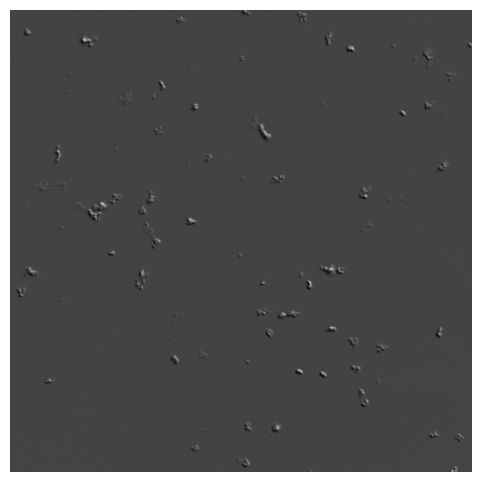

In [4]:
import cv2
# from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# Just for seeing what resized fields look like

im = cv2.imread("./train/F0000_C0_T0001_A0001_01-T5K2S375.png", cv2.IMREAD_GRAYSCALE)
#im = cv2.imread("./microscopy_great/train/F00.tif")
#im = cv2.imread("./planes/train/Airplane001.jpeg")
#im = cv2.imread("./airplanes/train/Airplane001.jpeg")
#im = cv2.imread("./planes_BW/train/Airplane001.jpeg")
#im = cv2.resize(im, (1000,1000))
dims = im.shape
print("Image dimensions:", dims)
# cv2_imshow(im)

plt.figure(figsize=(6,6))
plt.imshow(im, cmap='gray')  # already 3-channel RGB
plt.axis('off')
plt.show()

In [5]:
import torch
print(torch.__version__)
!gcc --version
!nvcc --version
# !nvidia-smi # see cuda version here when running on GPU

2.10.0
^C
zsh:1: command not found: nvcc


In [6]:
%cd "/Volumes/Ethan UCLA Harddrive/AI/detectron2-work/detectron2"
# %cd detectron2
# should be /content/drive/MyDrive/Detectron2/detectron2

/Volumes/Ethan UCLA Harddrive/AI/detectron2-work/detectron2


In [8]:
# import modules - source, Colab installation instructions
# Note: visual logging unavailable on Sherlock due to nature of remote connection

!pwd
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger # import error; resolved simply by restarting runtime
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
# from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

/Volumes/Ethan UCLA Harddrive/AI/detectron2-work/detectron2


In [ ]:
%cd ../
# Should now be in Detectron2 folder

In [9]:
!pwd

/Volumes/Ethan UCLA Harddrive/AI/detectron2-work/detectron2


In [19]:
# setup model configuration, import weights from url, run eval
# this doesn't work
# AttributeError: 'NoneType' object has no attribute 'shape'
# nvm, suddenly seems to work; maybe it was directory change that did it, unsure

# ignore incorrect class name "person" - dataset metadata set later on

cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6  # set threshold for this model - before 0.6
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
#cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
#im = cv2.imread('./microscopy_great/train/F00.tif')
#im = cv2.imread('./planes/train/Airplane001.jpeg')
#im = cv2.imread('./airplanes/train/Airplane001.jpeg')
#im = cv2.imread("./microscopy_new/train/F0000_C0_T0001_A0001_01-T5K2S375.jpg")
im = cv2.imread("/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/F0000_C0_T0001_A0001_01-T5K2S375.png")
# Note: B&W img has slightly reduced confidence, i.e. jet engines have 98% and 92%,
  # while have 99% and 97% with same model and same RGB img
#im = cv2.imread('./planes_BW/val/Airplane024.jpeg')
cfg.MODEL.DEVICE='cpu'
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

print("Number of classes:", cfg.MODEL.ROI_HEADS.NUM_CLASSES)

# print output

print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)


[03/18 11:52:26 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


model_final_f10217.pkl: 178MB [00:37, 4.76MB/s]                                 
/Users/ethancotta/miniconda3/lib/python3.12/site-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:4383.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
W0318 11:53:05.279000 53332 site-packages/torch/fx/_symbolic_trace.py:53] is_fx_tracing will return true for both fx.symbolic_trace and torch.export. Please use is_fx_tracing_symbolic_tracing() for specifically fx.symbolic_trace or torch.compiler.is_compiling() for specifically torch.export/compile.


Number of classes: 80
tensor([33, 33])
Boxes(tensor([[1549.2899,  779.0665, 1599.7340,  840.2196],
        [ 187.1517,  595.4964,  227.0364,  685.4451]]))


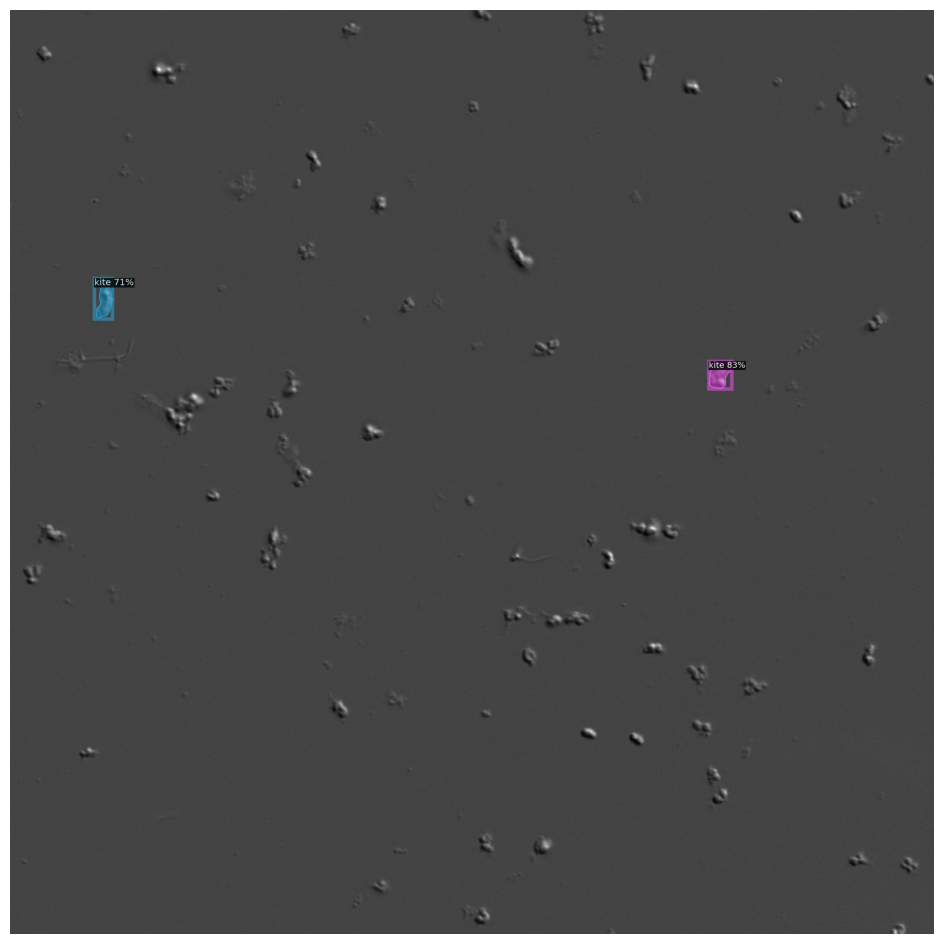

In [22]:
# visualize that output
scale = 1.0 # before 0.4
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=scale)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
# cv2_imshow(out.get_image()[:, :, ::-1])

plt.figure(figsize=(12,12))
plt.imshow(out.get_image()[:,:,::-1])  # already 3-channel RGB
plt.axis('off')
plt.show()

In [ ]:
%cd detectron2/

In [ ]:
# skip this for now - explicitly using DefaultTrainer instead in a later cell

# training
# should be in directory: /content/drive/MyDrive/Detectron2/detectron2/

# %cd tools/
# ./train_net.py --num-gpus 1 \
#    --config-file ../configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml

# want 1 gpu for now, not 2+
# %cd tools/
!python3 ./train_net.py \
  --config-file ../configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml \
  --num-gpus 1 SOLVER.IMS_PER_BATCH 2 SOLVER.BASE_LR 0.0025

In [23]:
!pwd

/Volumes/Ethan UCLA Harddrive/AI/detectron2-work/detectron2


In [ ]:
%cd ../
# should go into Detectron2 folder

In [44]:
from detectron2.data import DatasetCatalog, MetadataCatalog

# Remove old registration
if "microscopy_train" in DatasetCatalog.list():
    DatasetCatalog.remove("microscopy_train")
if "microscopy_val" in DatasetCatalog.list():
    DatasetCatalog.remove("microscopy_val")

if "microscopy_train" in MetadataCatalog.list():
    MetadataCatalog.remove("microscopy_train")
if "microscopy_val" in MetadataCatalog.list():
    MetadataCatalog.remove("microscopy_val")

In [45]:
from detectron2.data.datasets import register_coco_instances
# register_coco_instances("microscopy_train", {}, "microscopy/train/train_anns.json", "microscopy/train/")
# register_coco_instances("microscopy_val", {}, "microscopy/val/val_anns.json", "microscopy/val/")
# register_coco_instances("microscopy_train", {}, "microscopy_great/train/train_anns.json", "microscopy_great/train/")
# register_coco_instances("microscopy_val", {}, "microscopy_great/val/val_anns.json", "microscopy_great/val/")
# register_coco_instances("microscopy_test", {}, "microscopy_great/test/test_anns.json", "microscopy_great/test/")
# register_coco_instances("planes_train", {}, "planes/train/planes_F01_F20.json", "planes/train/")
# register_coco_instances("planes_val", {}, "planes/val/planes_F21_F25.json", "planes/val/")
# register_coco_instances("airplanes_train", {}, "airplanes/train/airplanes_F01_F20.json", "airplanes/train/")
# register_coco_instances("airplanes_val", {}, "airplanes/val/airplanes_F21_F25.json", "airplanes/val/")
#register_coco_instances("planes_BW_train", {}, "planes_BW/train/planes_BW_F01_F20.json", "planes_BW/train/")
#register_coco_instances("planes_BW_val", {}, "planes_BW/val/planes_BW_F21_F25.json", "planes_BW/val/")
#register_coco_instances("microscopy_train", {}, "microscopy_new/train/train_anns_F0000_F0044.json", "microscopy_new/train/")
#register_coco_instances("microscopy_val", {}, "microscopy_new/val/val_anns_F0045_F0049.json", "microscopy_new/val/")
#register_coco_instances("microscopy_train", {}, "microscopy_100/train/train_anns_F0000_F0089.json", "microscopy_100/train/")
#register_coco_instances("microscopy_val", {}, "microscopy_100/val/val_anns_F0090_F0099.json", "microscopy_100/val/")
register_coco_instances("microscopy_train", {}, "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/train_anns.json", "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/")
register_coco_instances("microscopy_val", {}, "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/val/val_anns.json", "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/val/")

In [46]:
# cd as needed into Detectron2 folder but not repo
!pwd

/Volumes/Ethan UCLA Harddrive/AI/detectron2-work/detectron2


[03/18 11:56:53 d2.data.datasets.coco]: Loaded 2 images in COCO format from /Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/train_anns.json


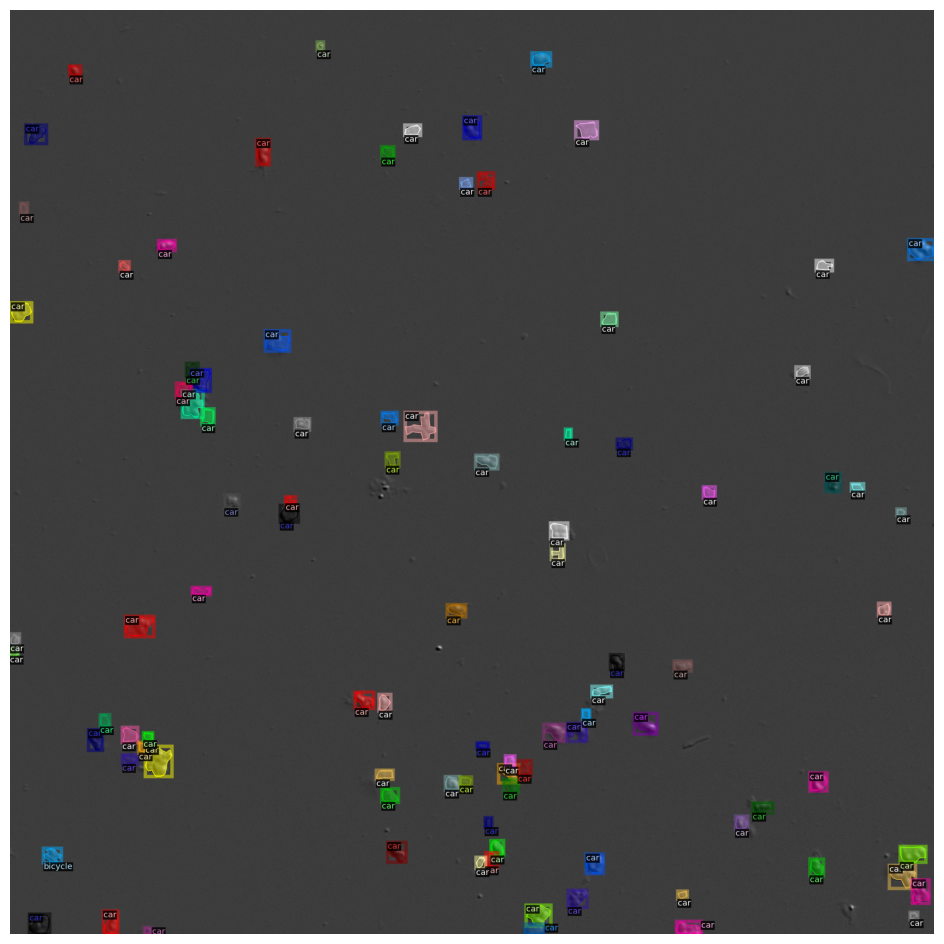

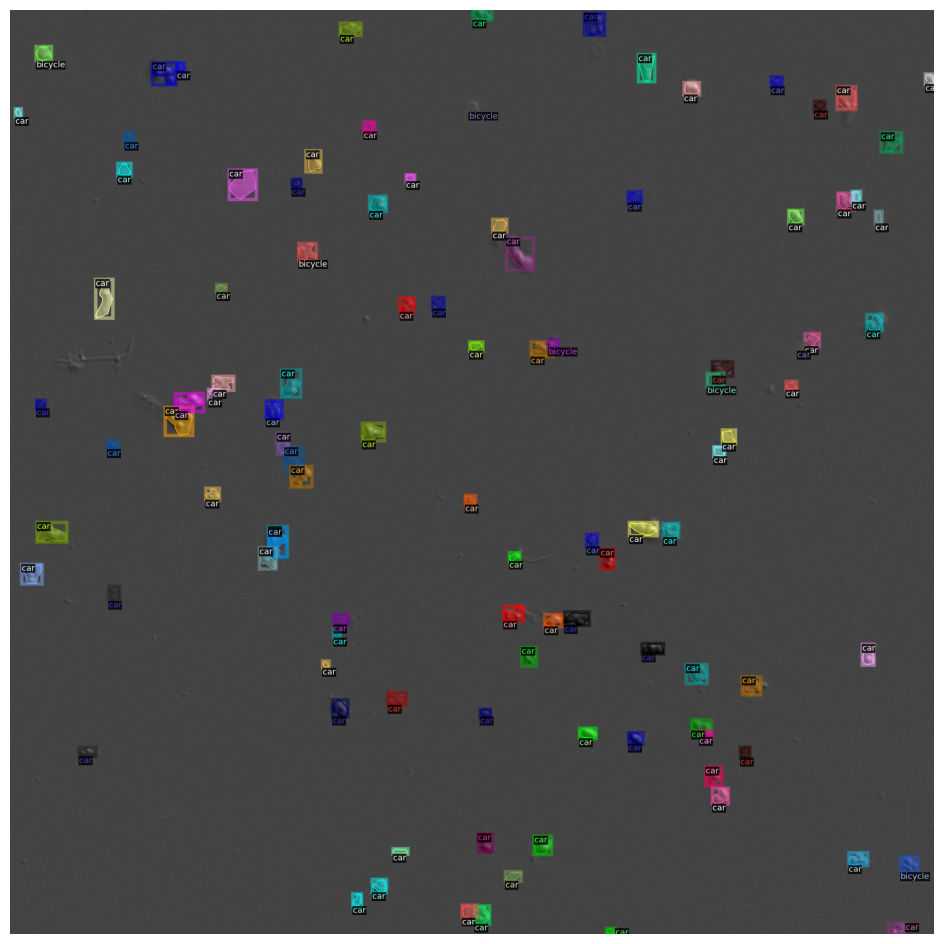

In [29]:
from detectron2.data.datasets import load_coco_json
# visualize training annotations and check data setup

# number of images from training dataset want to display
# n = 3
n = 2

#dataset_dicts = load_coco_json("microscopy/train/train_anns.json", "microscopy/train/", dataset_name = "microscopy_train")
#dataset_dicts = load_coco_json("microscopy_great/train/train_anns.json", "microscopy_great/train/", dataset_name = "microscopy_train")
#dataset_dicts = load_coco_json("planes/train/planes_F01_F20.json", "planes/train/", dataset_name = "planes_train")
#dataset_dicts = load_coco_json("airplanes/train/airplanes_F01_F20.json", "airplanes/train/", dataset_name = "airplanes_train")
#dataset_dicts = load_coco_json("planes_BW/train/planes_BW_F01_F20.json", "planes_BW/train/", dataset_name = "planes_BW_train")
#dataset_dicts = load_coco_json("microscopy_new/train/train_anns_F0000_F0044.json", "microscopy_new/train/", dataset_name = "microscopy_train")
dataset_dicts = load_coco_json("/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/train_anns.json", "/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/", dataset_name = "microscopy_train")
for d in random.sample(dataset_dicts, n):
    img = cv2.imread(d["file_name"])
    #visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.5)
    visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.0)
    out = visualizer.draw_dataset_dict(d)
    
    plt.figure(figsize=(12,12))
    plt.imshow(out.get_image()[:,:,::-1])  # already 3-channel RGB
    plt.axis('off')
    plt.show()

In [52]:
# set up config and training

# in line trainer = DefaultTrainer(cfg), KeyError: Categories
  # will try load_coco_json() to get dictionary of anns instead of register_coco_instances

# Once when running, Cuda Side Trigger Error - disappeared when restarted runtime

cfg = get_cfg() # uncommented before
# the above line gets a default config that already has some default data augments: ResizeShortestEdge, RandomFlip(horizontal)
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
# cfg.DATASETS.TRAIN = ("balloon_train",)
# cfg.DATASETS.TRAIN = ("minicoco_train",)
#cfg.DATASETS.TRAIN = ("chromosomes_train",)
#cfg.DATASETS.TEST = ("chromosomes_val",)
#cfg.DATASETS.TRAIN = ("microscopy_train",)
#cfg.DATASETS.TEST = ("microscopy_val","microscopy_test",)
#cfg.DATASETS.TRAIN = ("planes_train",)
#cfg.DATASETS.TEST = ("planes_val",)
#cfg.DATASETS.TRAIN = ("airplanes_train",)
#cfg.DATASETS.TEST = ("airplanes_val",)
#cfg.DATASETS.TRAIN = ("planes_BW_train",)
#cfg.DATASETS.TEST = ("planes_BW_val",)
cfg.DATASETS.TRAIN = ("microscopy_train",)
cfg.DATASETS.TEST = ("microscopy_val",)
# cfg.DATALOADER.NUM_WORKERS = 2
cfg.DATALOADER.NUM_WORKERS = 1
# uncomment later for weight transfer
# yaml file only holds model config/structure, not weights; pretrained weights loaded in by url from model zoo
# Uncomment below line for initializing other parts of Mask R-CNN for transfer learning
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
# Should no longer initialize the backbone since using ConvNeXtV2, but should apply to other parts of Mask R-CNN

# or, resume from last checkpoint (untested so far)
#cfg.MODEL.WEIGHTS = "microscopy_great/output/model_final.pth" # tested, works
#cfg.MODEL.WEIGHTS = "microscopy_new/output/model_final.pth"
#cfg.MODEL.WEIGHTS = "microscopy_new/custom_model/output/model_final.pth"
# or (?),
#cfg.MODEL.WEIGHTS = "microscopy_great/output/last_checkpoint" # this does not work
#cfg.MODEL.WEIGHTS = "planes_BW/output/model_final.pth"
# cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
#cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
# iteration: gradient update of one batch's backprop
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
#. if resume=True, sets total number of iters, not relative number of iters to add on top of previous training
#cfg.SOLVER.MAX_ITER = 6000
# cfg.SOLVER.MAX_ITER = 2000
# cfg.SOLVER.MAX_ITER = 800
# cfg.SOLVER.MAX_ITER = 3200
# cfg.SOLVER.MAX_ITER = 5000
# cfg.SOLVER.MAX_ITER = 7200 # use this for actual training
#cfg.SOLVER.MAX_ITER = 12000
cfg.SOLVER.STEPS = []        # do not decay learning rate
# 128 ROIs in past not 512
# unclear what this line does - no noticeable affect on predictions?
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
# trying to balance lower number of fg region proposals by decreasing all and therefore bg region proposals
# no work, fg/bg maintains same ratio
# also, ground truth boxes, according to raw code, are always included as positive proposals
# #+/- anchors unaffected by BATCH_SIZE_PER_IMAGE, this is expected
# anchor sampling, see function subsample_labels()
  # selects all positive anchors only limited by threshold ratio of +/-, and fill remaining slots with negative anchors
# In below experimental set, no significant deviation from ~4 GB GPU RAM
# The very high ROI numbers had loss of ~0.6; lower, ~1+
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/248 +/- anchors, 7/121 fg/bg ROIs
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 40 # 8/248 +/- anchors, 2/38 fg/bg ROIs
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 10 # 2/8 fg/bg; towards iter 1000, fg wanted to rise
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 20 # 2/18 fg/bg; ~6 min to train 1000 iters
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512 # 8/248 +/- anchors; 2/510 fg/bg; loss smaller at 0.6, slower training for +; ~7:30 min to train 1000 iters
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 2048 # 8/248 +/- anchors, ?-does not add up to 2048; 9/999 fg/bg, ~7:30 train
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 2048 # more appropriate maybe for more ROIs <- no, only adding neg anchors; default = 256
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 2048 # 8/2040 +/- anchors; 2/1000 fg/bg (? does not add up to 2048)
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 32 # reasoning, only ~8 pos anchors even with airplanes dataset
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 32 # 8/24 +/- anchors; 2/30 fg/bg; higher loss ~1.2; fg clearly went from 1.5 to 2.5, but stagnates
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/120 +/- anchors; 2/126 fg/bg; loss 0.84; fg clearly 1.5 -> 2.5, exponential improvement
# what do #anchors do?
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 512
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/504 +/- anchors; 2/126 fg/bg; loss 0.6823; fg stagnates at 1.5 -> 2
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 256 # the default
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 # 8/248 +/- anchors; 2/126 fg/bg; loss 0.72; fg stagnates at 1.5 -> 2; conflicts with top result(?)
#cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
#cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256 # 8/120 +/- anchors; 2/254 fg/bg; loss 0.75; fg clearly 1.5 -> 2.5, exponential improvement; more violent than 128 anc/128 ROIs
# choose 128 or 256 anchors/proposals; 128 for both seems best
# now, change learning rate - want fastest increase in #fg proposals
# cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
# cfg.SOLVER.BASE_LR = 0.0025 # 0.00025 originally; 10x greater here
  # 8/248 +/- anchors; 3/125 fg/bg; loss 0.80
#cfg.SOLVER.BASE_LR = 0.025 # training diverged, and didn't go above 2 fg ROIs

# cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 128
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
# Overfit training:
cfg.MODEL.RPN.BATCH_SIZE_PER_IMAGE = 512
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
cfg.SOLVER.BASE_LR = 0.0025
cfg.SOLVER.IMS_PER_BATCH = 2 # increase batch size as training progresses; GPU RAM 11.5 GB

# Theory: during early training, none of region proposals have significant overlap with ground truth (source: Detectron2 code comment)
cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION= 0.25 # default 0.25, max ratio of fg/bg
# cfg.MODEL.ROI_HEADS.POSITIVE_FRACTION = 0.5
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3
#cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
#cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrectly use num_classes+1 here.

# Now, using ConvNeXtV2
cfg.MODEL.BACKBONE.NAME = "build_convnextv2_fpn_backbone"
#cfg.MODEL.RESNETS.DEPTH = "convnextv2_base" # CUDA OOM errors when batch size > 1, even when resize imgs

# cfg.MODEL.RESNETS.DEPTH = "convnextv2_tiny" # twice as fast as convnextv2_base; same mem usage
# cfg.MODEL.RESNETS.DEPTH = "convnextv2_femto"
cfg.MODEL.RESNETS.DEPTH = "convnextv2_femto" # base -> CUDA OOM error when run trainer.train()
# When increased batch size 1 -> 2, 9.5 GB -> 10.0 GB
# Transfer learning not working, as the second stage heads' losses climb during training
cfg.MODEL.BACKBONE.FREEZE_AT = 0 # keep unfrozen when not using transfer learning; default is 2 (only stem and next stage of backbone frozen)

#cfg.OUTPUT_DIR = 'microscopy/output/'
#cfg.OUTPUT_DIR = 'microscopy_great/output/'
#cfg.OUTPUT_DIR = 'planes/output/'
#cfg.OUTPUT_DIR = 'airplanes/output/'
#cfg.OUTPUT_DIR = 'planes_BW/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/default_model/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_repo_pretrained/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_fcmae_pretrained/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_tiny_random_init/output/'
#cfg.OUTPUT_DIR = 'microscopy_new/custom_model_femto_random_init/output/'
#cfg.OUTPUT_DIR = 'microscopy_100/custom_model_femto_random_init/output/'
#cfg.OUTPUT_DIR = 'microscopy_100/custom_model_tiny_random_init/output/'
cfg.OUTPUT_DIR = '/Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/convnextv2_femto_random_init/output/'
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

cfg.MODEL.DEVICE='cpu'
cfg.SOLVER.PRINT_INTERVAL=1

# print number of epochs
#num_imgs = 10
# images with no annotations since empty do not count (already omitted in json file)
#num_imgs = 17
#num_imgs = 20
# microscopy_new dataset
#num_imgs = 45
# microscopy_100 dataset
#num_imgs = 90
# microscopy_overfit dataset
num_imgs = 2
print("Total number of epochs set:", cfg.SOLVER.MAX_ITER * cfg.SOLVER.IMS_PER_BATCH / num_imgs)
print("Total number of images to process:", cfg.SOLVER.IMS_PER_BATCH * cfg.SOLVER.MAX_ITER)


Total number of epochs set: 300.0
Total number of images to process: 600


In [ ]:
# Some checks for ResNet101 vs ResNet50; check with config retrieved from R50 vs R101 yaml
# print for ResNet 50 and ResNet 101 to check if only the depth is changed between them - easier if this is so
"""
cfg.MODEL.RESNETS.*
DEPTH
OUT_FEATURES
NUM_GROUPS
NORM
WIDTH_PER_GROUP
STRIDE_IN_1X1
RES5_DILATION
RES2_OUT_CHANNELS
STEM_OUT_CHANNELS
DEFORM_ON_PER_STAGE
DEFORM_MODULATED
DEFORM_NUM_GROUPS
"""
print(cfg.MODEL.RESNETS.STEM_OUT_CHANNELS)

In [ ]:
# TestBackbone: Resnet101
# Setting up manually so can do same procedure for more custom networks later

# import resnet.py
import detectron2.modeling.backbone
from detectron2.modeling.backbone.resnet import *
from detectron2.modeling.backbone.build import BACKBONE_REGISTRY

@BACKBONE_REGISTRY.register()
def build_resnet101_backbone(cfg, input_shape):
    """
    Create a ResNet instance from config.

    Returns:
        ResNet: a :class:`ResNet` instance.
    """
    # need registration of new blocks/stems?
    norm = cfg.MODEL.RESNETS.NORM
    stem = BasicStem(
        in_channels=input_shape.channels,
        out_channels=cfg.MODEL.RESNETS.STEM_OUT_CHANNELS,
        norm=norm,
    )

    # fmt: off
    freeze_at           = cfg.MODEL.BACKBONE.FREEZE_AT
    out_features        = cfg.MODEL.RESNETS.OUT_FEATURES
    depth               = cfg.MODEL.RESNETS.DEPTH
    num_groups          = cfg.MODEL.RESNETS.NUM_GROUPS
    width_per_group     = cfg.MODEL.RESNETS.WIDTH_PER_GROUP
    bottleneck_channels = num_groups * width_per_group
    in_channels         = cfg.MODEL.RESNETS.STEM_OUT_CHANNELS
    out_channels        = cfg.MODEL.RESNETS.RES2_OUT_CHANNELS
    stride_in_1x1       = cfg.MODEL.RESNETS.STRIDE_IN_1X1
    res5_dilation       = cfg.MODEL.RESNETS.RES5_DILATION
    deform_on_per_stage = cfg.MODEL.RESNETS.DEFORM_ON_PER_STAGE
    deform_modulated    = cfg.MODEL.RESNETS.DEFORM_MODULATED
    deform_num_groups   = cfg.MODEL.RESNETS.DEFORM_NUM_GROUPS
    # fmt: on
    assert res5_dilation in {1, 2}, "res5_dilation cannot be {}.".format(res5_dilation)

    if depth != 101:
      print("ERROR: Incompatible depth chosen, expecting 101.")

    num_blocks_per_stage = {
        18: [2, 2, 2, 2],
        34: [3, 4, 6, 3],
        50: [3, 4, 6, 3],
        101: [3, 4, 23, 3],
        152: [3, 8, 36, 3],
    }[depth]

    stages = []

    for idx, stage_idx in enumerate(range(2, 6)):
        # res5_dilation is used this way as a convention in R-FCN & Deformable Conv paper
        dilation = res5_dilation if stage_idx == 5 else 1
        first_stride = 1 if idx == 0 or (stage_idx == 5 and dilation == 2) else 2
        stage_kargs = {
            "num_blocks": num_blocks_per_stage[idx],
            "stride_per_block": [first_stride] + [1] * (num_blocks_per_stage[idx] - 1),
            "in_channels": in_channels,
            "out_channels": out_channels,
            "norm": norm,
        }
        # Use BasicBlock for R18 and R34.
        if depth in [18, 34]:
            stage_kargs["block_class"] = BasicBlock
        else:
            stage_kargs["bottleneck_channels"] = bottleneck_channels
            stage_kargs["stride_in_1x1"] = stride_in_1x1
            stage_kargs["dilation"] = dilation
            stage_kargs["num_groups"] = num_groups
            if deform_on_per_stage[idx]:
                stage_kargs["block_class"] = DeformBottleneckBlock
                stage_kargs["deform_modulated"] = deform_modulated
                stage_kargs["deform_num_groups"] = deform_num_groups
            else:
                stage_kargs["block_class"] = BottleneckBlock # Desired for Res101
        blocks = ResNet.make_stage(**stage_kargs)
        in_channels = out_channels
        out_channels *= 2
        bottleneck_channels *= 2
        stages.append(blocks)
    return ResNet(stem, stages, out_features=out_features, freeze_at=freeze_at)

# Set backbone in cfg to the one just created
cfg.MODEL.BACKBONE.NAME = 'build_resnet101_backbone'
cfg.MODEL.RESNETS.DEPTH = 101

In [41]:
# Test ConvNeXt V2 backbone definition here before merging with repo

# This file can be placed in Detectron2 directory, outside of detectron2 git dir

import torch
import torch.nn as nn
import torch.nn.functional as F

# also import from detectron2
from detectron2.layers import ShapeSpec
#from detectron2.modeling import backbone
from detectron2.modeling.backbone import Backbone
from detectron2.modeling.backbone.build import BACKBONE_REGISTRY


# ConvNeXt V2 neural network

class DropPath(nn.Module):
    """Drop paths (Stochastic Depth) per sample  (when applied in main path of residual blocks).
    """
    def __init__(self, drop_prob=None):
        super(DropPath, self).__init__()
        self.drop_prob = drop_prob

    def forward(self, x):
        return drop_path(x, self.drop_prob, self.training)

    def drop_path(x, drop_prob: float = 0., training: bool = False):
        """Drop paths (Stochastic Depth) per sample (when applied in main path of residual blocks).
        """

        if drop_prob == 0. or not training:
            return x

        keep_prob = 1 - drop_prob
        shape = (x.shape[0],) + (1,) * (x.ndim - 1)  # work with diff dim tensors, not just 2D ConvNets
        random_tensor = keep_prob + torch.rand(shape, dtype=x.dtype, device=x.device)
        random_tensor.floor_()  # binarize
        output = x.div(keep_prob) * random_tensor
        return output

class LayerNorm(nn.Module):
    """ LayerNorm that supports two data formats: channels_last (default) or channels_first.
    The ordering of the dimensions in the inputs. channels_last corresponds to inputs with
    shape (batch_size, height, width, channels) while channels_first corresponds to inputs
    with shape (batch_size, channels, height, width).
    """
    def __init__(self, normalized_shape, eps=1e-6, data_format="channels_last"):
        super().__init__()
        self.weight = nn.Parameter(torch.ones(normalized_shape))
        self.bias = nn.Parameter(torch.zeros(normalized_shape))
        self.eps = eps
        self.data_format = data_format
        if self.data_format not in ["channels_last", "channels_first"]:
            raise NotImplementedError
        self.normalized_shape = (normalized_shape, )

    def forward(self, x):
        if self.data_format == "channels_last":
            return F.layer_norm(x, self.normalized_shape, self.weight, self.bias, self.eps)
        elif self.data_format == "channels_first":
            u = x.mean(1, keepdim=True)
            s = (x - u).pow(2).mean(1, keepdim=True)
            x = (x - u) / torch.sqrt(s + self.eps)
            x = self.weight[:, None, None] * x + self.bias[:, None, None]
            return x

class GRN(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.gamma = nn.Parameter(torch.zeros(1, 1, 1, dim))
        self.beta = nn.Parameter(torch.zeros(1, 1, 1, dim))

    def forward(self, x):
        #delete later
        if torch.isnan(x).any().item():
            print('NaN in forward pass before GRN')
        Gx = torch.norm(x, p=2, dim=(1,2), keepdim=True)
        Nx = Gx / (Gx.mean(dim=-1, keepdim=True) + 1e-6)
        out = self.gamma * (x * Nx) + self.beta + x
        if torch.isnan(out).any().item():
            print('NaN in forward pass after GRN')
        return out

class Block(nn.Module):
    def __init__(self, dim, drop_path=0.):
        super().__init__()
        self.dwconv = nn.Conv2d(dim, dim, kernel_size=7, padding=3, groups=dim)
        self.norm = LayerNorm(dim, eps=1e-6)
        self.pwconv1 = nn.Linear(dim, 4 * dim)
        self.act = nn.GELU()
        self.grn = GRN(4 * dim)
        self.pwconv2 = nn.Linear(4 * dim, dim)
        self.drop_path = DropPath(drop_path) if drop_path > 0. else nn.Identity()

    def forward(self, x):
        x_res = x
        x = self.dwconv(x)
        x = x.permute(0, 2, 3, 1) # (N, C, H, W) -> (N, H, W, C)
        x = self.norm(x)
        x = self.pwconv1(x)
        x = self.act(x)
        x = self.grn(x)
        x = self.pwconv2(x)
        x = x.permute(0, 3, 1, 2) # (N, H, W, C) -> (N, C, H, W)

        x = x_res + self.drop_path(x)
        return x

class ConvNeXtV2(Backbone):
    def __init__(self, in_chans=3, num_classes=1000,
                 depths=[3, 3, 27, 3], dims=[128, 256, 512, 1024],
                 drop_path_rate=0., filepath=None):
        super().__init__()
        self.depths = depths
        self.dims = dims
        self.downsample_layers = nn.ModuleList()  # stem, and 3 downsampling conv layers

        stem = nn.Sequential(nn.Conv2d(in_chans, dims[0], kernel_size=4, stride=4),
                            LayerNorm(dims[0], eps=1e-6, data_format="channels_first"))
        self.downsample_layers.append(stem)

        assert len(dims)-1 == 3, "ConvNeXtV2 error, only 3 downsampling layers typically used. For FPN integration, only 5 stages permitted (4 dims)."

        for i in range(len(dims)-1): # downsampling layer btw stages
            downsample_layer = nn.Sequential(
                LayerNorm(dims[i], eps=1e-6, data_format="channels_first"),
                nn.Conv2d(dims[i], dims[i+1], kernel_size=2, stride=2))
            self.downsample_layers.append(downsample_layer)

        self.stages = nn.ModuleList()
        dp_rates = [x.item() for x in torch.linspace(0, drop_path_rate, sum(depths))]
        self._out_features = ["res2", "res3", "res4", "res5"]
        assert len(self._out_features) == len(dims), "ConvNeXtV2 error, mismatch between stage and stage name counts."
        cur = 0
        for i in range(len(dims)):
            stage = nn.Sequential(
                *[Block(dim=dims[i], drop_path=dp_rates[cur+j]) for j in range(depths[i])]
            )
            self.stages.append(stage)
            cur += depths[i]
        self.norm = nn.LayerNorm(dims[-1], eps=1e-6) # final norm layer
        self.head = nn.Linear(dims[-1], num_classes)

        self._out_feature_channels = {self._out_features[i]: self.dims[i]
            for i in range(len(self._out_features))
        }
        # Manually setting for ConvNeXt V2 model
        # downsampling factors: [4, 2, 2, 2]
        stride_factors = [4, 8, 16, 32]
        self._out_feature_strides = {self._out_features[i]: stride_factors[i]
            for i in range(len(self._out_features))
        }

    def forward(self, x):
        outputs = {}
        for i in range(len(self.dims)):
            x = self.downsample_layers[i](x)
            x = self.stages[i](x)
            # FPN output
            stage_name = self._out_features[i]
            outputs[stage_name] = x
        # x = self.norm(x.mean([-2, -1])) # Global average pooling
        # x = self.head(x)
        assert len(outputs) == len(self._out_features), "ConvNeXtV2 error, output dim mismatch with FPN."
        return outputs

    def out_channel_count():
        return self.dims[-1]

    # detectron2 specific methods
    def output_shape(self):
        return {
            name: ShapeSpec(
                channels=self._out_feature_channels[name], stride=self._out_feature_strides[name]
            )
            for name in self._out_features
        }

    def freeze(self, freeze_at=0):
        """
        Freeze the first several stages of the ResNet. Commonly used in
        fine-tuning.

        Layers that produce the same feature map spatial size are defined as one
        "stage" by :paper:`FPN`.

        Args:
            freeze_at (int): number of stages to freeze.
                `1` means freezing the stem. `2` means freezing the stem and
                one residual stage, etc.

        Returns:
            nn.Module: this ResNet itself
        """
        # Unfreeze all layers first before calling this function
        # for p in self.down # 12/2/2024, unsure what this line is for
        if freeze_at >= 1:
            for p in self.downsample_layers[0].parameters():
                p.requires_grad = False
        for idx in range(0, len(self.stages)):
            if freeze_at > idx:
                for p in self.stages[idx].parameters():
                    p.requires_grad = False
                if (idx + 1) < len(self.downsample_layers):
                    for p in self.downsample_layers[idx+1].parameters():
                        p.requires_grad = False
            else: # Untested
                for p in self.stages[idx].parameters():
                    p.requires_grad = True
                if (idx+1) < len(self.downsample_layers):
                    for p in self.downsample_layers[idx+1].parameters():
                        p.requires_grad = True
        return self

def convnextv2_atto(**kwargs):
    model = ConvNeXtV2(depths=[2, 2, 6, 2], dims=[40, 80, 160, 320], **kwargs)
    return model

def convnextv2_femto(**kwargs):
    model = ConvNeXtV2(depths=[2, 2, 6, 2], dims=[48, 96, 192, 384], **kwargs)
    return model

def convnextv2_pico(**kwargs):
    model = ConvNeXtV2(depths=[2, 2, 6, 2], dims=[64, 128, 256, 512], **kwargs)
    return model

def convnextv2_nano(**kwargs):
    model = ConvNeXtV2(depths=[2, 2, 8, 2], dims=[80, 160, 320, 640], **kwargs)
    return model

def convnextv2_tiny(**kwargs):
    model = ConvNeXtV2(depths=[3, 3, 9, 3], dims=[96, 192, 384, 768], **kwargs)
    return model

def convnextv2_base(**kwargs):
    model = ConvNeXtV2(depths=[3, 3, 27, 3], dims=[128, 256, 512, 1024], **kwargs)
    return model

def convnextv2_large(**kwargs):
    model = ConvNeXtV2(depths=[3, 3, 27, 3], dims=[192, 384, 768, 1536], **kwargs)
    return model

def convnextv2_huge(**kwargs):
    model = ConvNeXtV2(depths=[3, 3, 27, 3], dims=[352, 704, 1408, 2816], **kwargs)
    return model

@BACKBONE_REGISTRY.register()
def build_convnextv2_backbone(cfg, input_shape):
    name = cfg.MODEL.RESNETS.DEPTH # reusing existing cfg resnet attribute for convnextv2 size specification
    backbones = {
        "convnextv2_atto": convnextv2_atto,
        "convnextv2_femto": convnextv2_femto,
        "convnextv2_pico": convnextv2_pico,
        "convnextv2_nano": convnextv2_nano,
        "convnextv2_tiny": convnextv2_tiny,
        "convnextv2_base": convnextv2_base,
        "convnextv2_large": convnextv2_large,
        "convnextv2_huge": convnextv2_huge
    }
    assert name in backbones, "Error, build_convnextv2_backbone(), cfg.MODEL.RESNETS.DEPTH does not match convnextv2 model sizes (convnextv2_atto, ...)"
    return backbones[name](in_chans=input_shape.channels)


AssertionError: An object named 'build_convnextv2_backbone' was already registered in 'BACKBONE' registry!

In [ ]:
# Bi-FPN

import torch
import torch.nn as nn
import torch.nn.functional as F

# also import from detectron2
from detectron2.layers import ShapeSpec
#from detectron2.modeling import backbone
from detectron2.modeling.backbone import Backbone
from detectron2.modeling.backbone.build import BACKBONE_REGISTRY



In [ ]:
import torch

# Try loading the file
backbone_weights_path = './fcmae_to_vanilla_backbone_weights.pth'
backbone_weights = torch.load(backbone_weights_path)

# Print the type of the loaded object and its contents
print(f"Type of loaded object: {type(backbone_weights)}")
# print("Loaded object:", backbone_weights)

In [56]:
# train

# For airplanes dataset, CUDA out of memory error - trying w/o rotational data augmentation...
# CUDA memory error solved by using main branch of git repo, which did not use rotational data augmentation

from detectron2.engine import DefaultTrainer

# backbone_weights_path = './convnextv2_base.pth' # TO-DO: set later
# backbone_weights_path = './convnextv2_tiny_1k_224_ema.pt'
# backbone_weights_path = './fcmae_to_vanilla_backbone_weights.pth'
# no backbone_weights_path for custom_model_base_random_init
# assert os.path.exists(backbone_weights_path)
# backbone_weights = torch.load(backbone_weights_path)
#trainer = DefaultTrainer(cfg)
# loads ConvNeXtV2 backbone weights independently of rest of network
# specifies transfer learning freezing phases - ROI heads, RPN heads, backbone last layer, entire model
# print("Type of weight file:", type(backbone_weights))
# trainer = DefaultTrainer(cfg, backbone_weights=backbone_weights, trans_lr_iters=[800,1600,2400]) # modded
trainer = DefaultTrainer(cfg, trans_lr_iters=[1, 2, 3])
  # unexpected keyword argument, backbone_weights error in above line of code
  # resolved
  # now, NameError: name 'schedule_transfer_learning' is not defined, line 412 (commented out, so strange)
trainer.resume_or_load(resume=False)
#trainer.resume_or_load(resume=True)
# try next line of checkpoint not loaded correctly
# trainer.resume_or_load(resume=True)

# print freezable layers, useful for transfer learning

for param in trainer.model.named_parameters():
    unfrozen = param[1].requires_grad
    msg = ""
    if not unfrozen:
        msg = "(frozen for training!)"
    print(param[0], msg)

[03/18 12:46:00 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(48, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(96, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(192, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(384, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ConvNeXtV2(
      (downsample_layers): ModuleList(
        (0): Sequential(
          (0): Conv2d(3, 48, kernel_size=(4, 4), stride=(4, 4))
          (1): LayerNorm()
        )
        (1): Sequential(
          (0): LayerNorm()
    

[03/18 12:46:00 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [Resize(shape=(1024, 1024)), RandomFlip(prob=0.5)]
[03/18 12:46:00 d2.data.datasets.coco]: Loaded 2 images in COCO format from /Volumes/Ethan UCLA Harddrive/AI/microscopy_overfit/train/train_anns.json
[03/18 12:46:00 d2.data.build]: Removed 0 images with no usable annotations. 2 images left.
[03/18 12:46:00 d2.data.build]: Using training sampler TrainingSampler
[03/18 12:46:00 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/18 12:46:00 d2.data.common]: Serializing 2 elements to byte tensors and concatenating them all ...
[03/18 12:46:00 d2.data.common]: Serialized dataset takes 0.05 MiB
[03/18 12:46:00 d2.data.build]: Making batched data loader with batch_size=2


AttributeError: 'DefaultTrainer' object has no attribute 'register_event_writer'

In [50]:
!pwd

/Volumes/Ethan UCLA Harddrive/AI/detectron2-work/detectron2


In [ ]:
import gc
torch.cuda.empty_cache()
gc.collect()

In [54]:
trainer.train()

[03/18 12:34:56 d2.engine.train_loop]: Starting training from iteration 0
Unfroze ROI heads.
Entered transfer learning phase: 1
Unfroze region proposal generator.
Entered transfer learning phase: 2
Unfroze last layer of backbone.
Entered transfer learning phase: 3
Unfroze whole model. Last transfer learning phase initiated.
Entered transfer learning phase: 4
[03/18 12:38:22 d2.utils.events]:  eta: 0:50:17  iter: 19  total_loss: 3.367  loss_cls: 0.9434  loss_box_reg: 0.0761  loss_mask: 0.6919  loss_rpn_cls: 0.6873  loss_rpn_loc: 0.9727    time: 10.7559  last_time: 11.1168  data_time: 0.1083  last_data_time: 0.0020   lr: 0.00016068  
[03/18 12:41:53 d2.utils.events]:  eta: 0:45:02  iter: 39  total_loss: 2.319  loss_cls: 0.4872  loss_box_reg: 0.03811  loss_mask: 0.6621  loss_rpn_cls: 0.5906  loss_rpn_loc: 0.5339    time: 10.5768  last_time: 10.3278  data_time: 0.0012  last_data_time: 0.0010   lr: 0.00032718  
[03/18 12:44:41 d2.engine.hooks]: Overall training speed: 53 iterations in 0:09:

KeyboardInterrupt: 

In [ ]:
# See training curves on Tensorboard
# takes a few seconds to load

%load_ext tensorboard
#%tensorboard --logdir ./microscopy/output
#%tensorboard --logdir ./microscopy_great/output/
#%tensorboard --logdir ./planes/output/
#%tensorboard --logdir ./airplanes/output/
#%tensorboard --logdir ./planes_BW/output/
#%tensorboard --logdir ./microscopy_new/output/
#%tensorboard --logdir ./microscopy_new/custom_model_fcmae_pretrained/output/
#%tensorboard --logdir ./microscopy_new/custom_model_tiny_random_init/output/
%tensorboard --logdir ./microscopy_100/custom_model_femto_random_init/output/

In [ ]:
# eval; modify for coco

# uncommented before
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
#cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.25 # before, 0.7
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

In [ ]:
# evaluate on single image of choice
im = cv2.imread("./microscopy_100/train/F0010_C0_T0001_A0001_01-T5K2S375.png")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

scale = 1.0
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=scale)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
orig_image = out.get_image()[:, :, ::-1]
# cv2_imshow(orig_image)
resized_image = cv2.resize(orig_image, (1024,1024))
cv2_imshow(resized_image)

In [ ]:
# run this if get
#NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968
# Which can happen if training is manually interrupted
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
# perform basic evaluation
# should be in Detectron2 folder

from detectron2.data.datasets import load_coco_json

# cfg.DATASETS.TEST[0] refers to first listed dataset in cfg for testing.
# though not used here, possible to test with multiple datasets which would be merged later on

# untested, but expected behavior: displays n fields with AI generated masks
#eval_dicts = load_coco_json("microscopy/val/val_anns.json", "microscopy/val/", dataset_name = "microscopy_val")
#eval_dicts = load_coco_json("microscopy_great/val/val_anns.json", "microscopy_great/val/", dataset_name = "microscopy_val")
#eval_dicts = load_coco_json("microscopy_great/test/test_anns.json", "microscopy_great/test/", dataset_name = "microscopy_test")
#eval_dicts = load_coco_json("planes/val/planes_F21_F25.json", "planes/val/", dataset_name = "planes_val")
#eval_dicts = load_coco_json("airplanes/val/airplanes_F21_F25.json", "airplanes/val/", dataset_name = "airplanes_val")
#eval_dicts = load_coco_json("planes_BW/val/planes_BW_F21_F25.json", "planes_BW/val/", dataset_name = "planes_BW_val")
#eval_dicts = load_coco_json("microscopy_new/val/val_anns_F0045_F0049.json", "microscopy_new/val/", dataset_name = "microscopy_val")
eval_dicts = load_coco_json("microscopy_100/val/val_anns_F0090_F0099.json", "microscopy_100/val/", dataset_name = "microscopy_val")
dataset_num = 0
#dataset_num = 1 # use if selecting test dataset not val dataset and if specified accordingly in config
n = 5
count = 1
scale = 1.0 # before, 0.4

for d in random.sample(eval_dicts, n):
  print("Evaluation on image", count)
  filepath = d["file_name"]
  print("File:", filepath)
  im = cv2.imread(filepath)
  print(im.shape)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TEST[dataset_num]), scale=scale)  # before, scale=1.2
  # apparently annotations from one loading of annotations onto v does not reset
  v_orig = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TEST[dataset_num]), scale=scale)
  #delete later
  print("cfg.DATASETS.TEST[0]:", cfg.DATASETS.TEST[0])
  if outputs["instances"].to("cpu") != None:
    print("Printing outputs...")
    print(outputs["instances"].to("cpu"))
    print("before...")
    print("Number of detections:", len(outputs["instances"]))
    out_AI = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    print("after...")
    cv2_imshow(out_AI.get_image()[:, :, ::-1])
  else:
    print("Error, should not be here.")
    print("No instances to display, so not printing.")

  print("Image's original annotations")
  # show labeled file for side by side comparison
  out_labeled = v_orig.draw_dataset_dict(d)
  cv2_imshow(out_labeled.get_image()[:, :, ::-1])
  count += 1


In [ ]:
# compute AP
# also, see trainer.test as alternative to this cell
# modify for coco

from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
# evaluator = COCOEvaluator("balloon_val", output_dir="./output")
#evaluator = COCOEvaluator("microscopy_val", output_dir="./output")
#evaluator = COCOEvaluator("microscopy_test", output_dir="./output")
#evaluator = COCOEvaluator("planes_val", output_dir="./output")
#evaluator = COCOEvaluator("airplanes_val", output_dir="./output")
#evaluator = COCOEvaluator("planes_BW_val", output_dir="./output")
evaluator = COCOEvaluator("microscopy_val", output_dir="./output")
# val_loader = build_detection_test_loader(cfg, "balloon_val")
val_loader = build_detection_test_loader(cfg, "microscopy_val")
#val_loader = build_detection_test_loader(cfg, "microscopy_test")
#val_loader = build_detection_test_loader(cfg, "planes_val")
#val_loader = build_detection_test_loader(cfg, "airplanes_val") # change to build_test_loader() to call overridden funct (TO-DO)
#val_loader = build_detection_test_loader(cfg, "planes_BW_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`